<a href="https://colab.research.google.com/github/aureliocollor/Algoritmos_de_agrupamento_para_musicas_semelhantes_a_Banda_Queen./blob/main/Projeto_UNIASSELVI_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Projeto Uniasselvi: Algoritmos de Agrupamento para músicas semelhantes a Banda Queen.





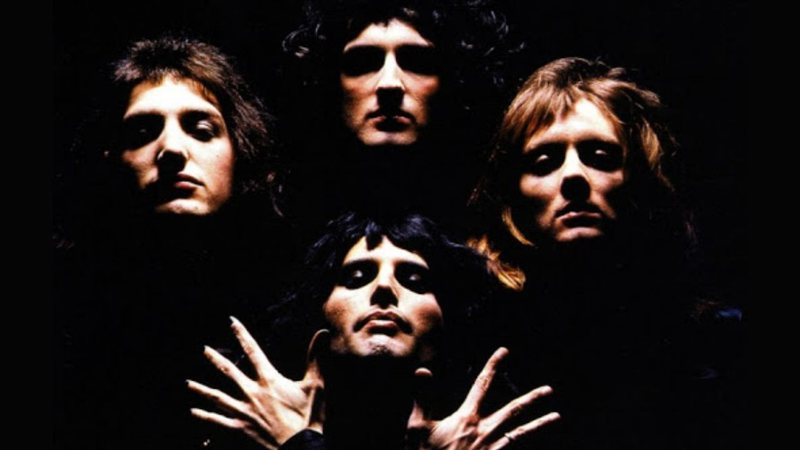

#Objetivo:

O objetivo desse projeto é agrupar de gêneros músicas com base nas semelhanças músicas da Banda Queen, utilizando caracteristicas especificas! Vou utilizar algoritmos de agrupamento para realizar essa tarefa, ou seja identificar padrões existentes em determinado Data Set.

#Um pouco da história...


Queen é uma banda de rock inglesa formada em 1970 e ativa até 1991 sob seu estilo clássico. O grupo era formado por Brian May (guitarra e vocal), Freddie Mercury (vocal e piano), John Deacon (baixo) e Roger Taylor (bateria e vocal). o recorde global de vendas. A música da banda também é conhecida por ser altamente eclética, abrangendo uma variedade de estilos de rock.

Para deixar o trabalho ainda mais ilustrativo, abaixo se encontra um dos maiores sucessos da banda a música Bohemian Rhapsody, que tem 5 segmentos. Primeiro, começa com uma introdução com os vocais harmoniosos de Mercury e acompanhamento de piano. Em seguida, há uma balada, terminando com um solo de guitarra do guitarrista Brian May. Assim que o solo começa, a parte da ópera é escrita inteiramente por Freddie Mercury, no entanto, ao contrário dos vocais de Mercury no início da música, a ópera também inclui um guitarrista e um baterista. Após a ópera, a seção "hard rock" começa e termina com outra balada lenta.

Para escutar o sucesso, basta apenas clicar no play abaixo:

In [ ]:
import IPython
IPython.display.Audio('Queen.mp3')

#Importando bibliotecas:

Vou iniciar o projeto importando as bibliotecas utilizadas para fazer a classificação!Pode-se definir as bibliotecas Python como uma coleção de módelos de script acessíveis, com objetivo de reduzir e facilitar o uso de códigos.Poden ser importando-os no início de um script. As bibliotecas utilizadas nesse projeto são:

-Numpy,biblioteca usada para trabalhar com array.

-Pandas, biblioteca utilizada para analisar dados.

-Sklearn, importando cluster utilizada para agrupamento K-means.


Através da importação das bibliotecas pode-se utilizar diferentes funções em nossos dados, como importar, analisar, classificar, visualizar, entre diversas outras funcionalidades.


In [ ]:
#Importando bibliotecas:

from sklearn import cluster
import numpy as np
import pandas as pd

#Conexão com o DataSet:

Através da função pandas.read_csv, é criado uma importação de dados em formato CSV(arquivos separados por vírgula) para o código! Aqui o arquivo em formato csv, sendo"Spotify-2000.csv"! Essa base de dados foi encontrado no site Kaggle, contendo estatísticas de áudio das 2000 principais faixas do aplicativo Spotify,músicas lançadas de 1956 a 2019, são cerca de 15 colunas, incluidas alguns artistas como os Queen, The Beatles, Elvis Presley, entre outros.




In [ ]:
#Criando conexão com o dataset:
data = pd.read_csv("Spotify-2000.csv")
print(data.head())

   Index                   Title             Artist            Top Genre  \
0      1                 Sunrise        Norah Jones      adult standards   
1      2             Black Night        Deep Purple           album rock   
2      3          Clint Eastwood           Gorillaz  alternative hip hop   
3      4           The Pretender       Foo Fighters    alternative metal   
4      5  Waitin' On A Sunny Day  Bruce Springsteen         classic rock   

   Year  Beats Per Minute (BPM)  Energy  Danceability  Loudness (dB)  \
0  2004                     157      30            53            -14   
1  2000                     135      79            50            -11   
2  2001                     168      69            66             -9   
3  2007                     173      96            43             -4   
4  2002                     106      82            58             -5   

   Liveness  Valence Length (Duration)  Acousticness  Speechiness  Popularity  
0        11       68          

#Pré processamento dos dados:

Nesse etapa do projeto, o primeiro contato com os dados é fundamental! Então é necessário entender em qual formato os dados se encontram, se é preciso excluir algo, inclui remover colunas desnecessárias, verificar valores ausentes, agregar vendas por data e assim por diante.


In [ ]:
#Resumo dos dados do Data Frame:
data.head()

,Index,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
0,1,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
1,2,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
2,3,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
3,4,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
4,5,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59


In [ ]:
#Localizando Queen:
Queen=data[963:964]

In [ ]:
#Imprima um resumo conciso de um DataFrame:
data.info

<bound method DataFrame.info of       Index                   Title                    Artist  \
0         1                 Sunrise               Norah Jones   
1         2             Black Night               Deep Purple   
2         3          Clint Eastwood                  Gorillaz   
3         4           The Pretender              Foo Fighters   
4         5  Waitin' On A Sunny Day         Bruce Springsteen   
...     ...                     ...                       ...   
1989   1990        Heartbreak Hotel             Elvis Presley   
1990   1991               Hound Dog             Elvis Presley   
1991   1992         Johnny B. Goode               Chuck Berry   
1992   1993               Take Five  The Dave Brubeck Quartet   
1993   1994          Blueberry Hill               Fats Domino   

                Top Genre  Year  Beats Per Minute (BPM)  Energy  Danceability  \
0         adult standards  2004                     157      30            53   
1              album rock

In [ ]:
#Excluindo coluna desnecessária:
data = data.drop("Index", axis=1)

In [ ]:
#Verificando o conjunto de dados após exclusão:
data

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity
0,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71
1,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39
2,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69
3,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76
4,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,Heartbreak Hotel,Elvis Presley,adult standards,1958,94,21,70,-12,11,72,128,84,7,63
1990,Hound Dog,Elvis Presley,adult standards,1958,175,76,36,-8,76,95,136,73,6,69
1991,Johnny B. Goode,Chuck Berry,blues rock,1959,168,80,53,-9,31,97,162,74,7,74
1992,Take Five,The Dave Brubeck Quartet,bebop,1959,174,26,45,-13,7,60,324,54,4,65


In [ ]:
#Verificando a correlação dos dados:
print(data.corr())

                            Year  Beats Per Minute (BPM)    Energy  \
Year                    1.000000                0.012570  0.147235   
Beats Per Minute (BPM)  0.012570                1.000000  0.156644   
Energy                  0.147235                0.156644  1.000000   
Danceability            0.077493               -0.140602  0.139616   
Loudness (dB)           0.343764                0.092927  0.735711   
Liveness                0.019017                0.016256  0.174118   
Valence                -0.166163                0.059653  0.405175   
Acousticness           -0.132946               -0.122472 -0.665156   
Speechiness             0.054097                0.085598  0.205865   
Popularity             -0.158962               -0.003181  0.103393   

                        Danceability  Loudness (dB)  Liveness   Valence  \
Year                        0.077493       0.343764  0.019017 -0.166163   
Beats Per Minute (BPM)     -0.140602       0.092927  0.016256  0.059653   
Ener

#Agrupando com K-means:

Utilizando o algoritmo de agrupamento K-Means, que pode ser definido como um alogoritmo (ou agrupamento) da biblioteca Scikit-Learn. Esse algoritmo é de aprendizagem não supervisionado, ou seja que não precisa de confirmação exterbas através de inputs,outro detalhe é que os dados são avalização de acordo com suas características para identificar as semelhanças entre os recursos, sendo nesse atual trabalho, os áudios. Para isso, é necessário criar um conjunto novo de dados, com todas as características de áudio e realizar a análise de agrupamentos utilizando o algoritmo K-means.




In [ ]:
#Analisando dados para encontrar semelhanças:

data2 = data[["Beats Per Minute (BPM)", "Loudness (dB)",
              "Liveness", "Valence", "Acousticness",
              "Speechiness"]]

from sklearn.preprocessing import MinMaxScaler
for i in data.columns:
    MinMaxScaler(i)

from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=10)
clusters = kmeans.fit_predict(data2)

In [ ]:
#Clusters conforme previsto pelo algoritmo de clustering K-means:
data["Music Segments"] = clusters
MinMaxScaler(data["Music Segments"])
data["Music Segments"] = data["Music Segments"].map({1: "Cluster 1", 2:
    "Cluster 2", 3: "Cluster 3", 4: "Cluster 4", 5: "Cluster 5",
    6: "Cluster 6", 7: "Cluster 7", 8: "Cluster 8",
    9: "Cluster 9", 10: "Cluster 10"})

In [ ]:
Queen

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity,Music Segments
1000,Somebody To Love - 2011 Mix,Queen,glam rock,1976,112,69,50,-7,22,36,296,19,6,70,NaN


In [ ]:
data

,Title,Artist,Top Genre,Year,Beats Per Minute (BPM),Energy,Danceability,Loudness (dB),Liveness,Valence,Length (Duration),Acousticness,Speechiness,Popularity,Music Segments
0,Sunrise,Norah Jones,adult standards,2004,157,30,53,-14,11,68,201,94,3,71,Cluster 8
1,Black Night,Deep Purple,album rock,2000,135,79,50,-11,17,81,207,17,7,39,Cluster 4
2,Clint Eastwood,Gorillaz,alternative hip hop,2001,168,69,66,-9,7,52,341,2,17,69,Cluster 5
3,The Pretender,Foo Fighters,alternative metal,2007,173,96,43,-4,3,37,269,0,4,76,Cluster 5
4,Waitin' On A Sunny Day,Bruce Springsteen,classic rock,2002,106,82,58,-5,10,87,256,1,3,59,Cluster 1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,Heartbreak Hotel,Elvis Presley,adult standards,1958,94,21,70,-12,11,72,128,84,7,63,Cluster 6
1990,Hound Dog,Elvis Presley,adult standards,1958,175,76,36,-8,76,95,136,73,6,69,Cluster 8
1991,Johnny B. Goode,Chuck Berry,blues rock,1959,168,80,53,-9,31,97,162,74,7,74,Cluster 8
1992,Take Five,The Dave Brubeck Quartet,bebop,1959,174,26,45,-13,7,60,324,54,4,65,Cluster 8


In [ ]:
#Visualizando o conjunto de dados:
print(data.head())

                    Title             Artist            Top Genre  Year  \
0                 Sunrise        Norah Jones      adult standards  2004   
1             Black Night        Deep Purple           album rock  2000   
2          Clint Eastwood           Gorillaz  alternative hip hop  2001   
3           The Pretender       Foo Fighters    alternative metal  2007   
4  Waitin' On A Sunny Day  Bruce Springsteen         classic rock  2002   

   Beats Per Minute (BPM)  Energy  Danceability  Loudness (dB)  Liveness  \
0                     157      30            53            -14        11   
1                     135      79            50            -11        17   
2                     168      69            66             -9         7   
3                     173      96            43             -4         3   
4                     106      82            58             -5        10   

   Valence Length (Duration)  Acousticness  Speechiness  Popularity  \
0       68           

In [ ]:
#Visualizar os clusters com base em alguns dos recursos de áudio
import plotly.graph_objects as go
PLOT = go.Figure()
for i in list(data["Music Segments"].unique()):


    PLOT.add_trace(go.Scatter3d(x = data[data["Music Segments"]== i]['Beats Per Minute (BPM)'],
                                y = data[data["Music Segments"] == i]['Danceability'],
                                z = data[data["Music Segments"] == i]['Energy'],
                                mode = 'markers',marker_size = 6, marker_line_width = 1,
                                name = str(i)))
PLOT.update_traces(hovertemplate='Beats Per Minute (BPM): %{x} <br>Danceability: %{y} <br>Energy: %{z}')


PLOT.update_layout(width = 800, height = 800, autosize = True, showlegend = True,
                   scene = dict(xaxis=dict(title = 'Beats Per Minutes (BPM)', titlefont_color = 'black'),
                                yaxis=dict(title = 'Energy', titlefont_color = 'black'),
                                zaxis=dict(title = 'Danceability', titlefont_color = 'black')),
                   font = dict(family = "Gilroy", color  = 'black', size = 12))

#Final

(Editar)
Com isso finalizo meu projeto! Abaixo segue uma música da Queen para reproduzir e descobrir um pouco mais sobre:

#REFERENCIA

https://pt.wikibooks.org/wiki/Python/Bibliotecas_padr%C3%A3o

https://numpy.org/

https://pandas.pydata.org/

https://harve.com.br/blog/programacao-python-blog/pandas-python-vantagens-e-como-comecar/

https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

https://www.w3schools.com/python/pandas/pandas_csv.asp

https://www.worten.pt/queen-historia

https://pt.wikipedia.org/wiki/Bohemian_Rhapsody


